In [1]:
import os
import time
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim

import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv("../../../data/resample_minmax_all.csv")

# Separate ID  and the target columns
data_id = data["apogee_id"]
data_target = data[["TEFF", "LOGG", "J", "H", "K"]]

# Drop them from the main DataFrame to keep only the features
columns_to_drop = ["apogee_id", "TEFF", "LOGG", "J", "H", "K"]
data_features = data.drop(columns=columns_to_drop)

print("Data loaded successfully!")
print("Feature columns:", data_features.columns.tolist())
print("Target columns: TEFF, LOGG, J, H, K")

# Convert data to float32 and create torch tensors
data_features = data_features.astype('float32').reset_index(drop=True)
data_target   = data_target.astype('float32').reset_index(drop=True)

X_full  = torch.tensor(data_features.values, dtype=torch.float32)
y_teff  = torch.tensor(data_target["TEFF"].values, dtype=torch.float32)
y_logg  = torch.tensor(data_target["LOGG"].values, dtype=torch.float32)

print("Feature tensor shape:", X_full.shape)
print("TEFF shape:", y_teff.shape)
print("LOGG shape:", y_logg.shape)

# Train/test split (90% / 10%)
N = len(X_full)
indices = np.arange(N)
np.random.seed(42)
np.random.shuffle(indices)
split_idx = int(0.9 * N)

train_idx = indices[:split_idx]
test_idx  = indices[split_idx:]

X_train       = X_full[train_idx]
y_teff_train  = y_teff[train_idx]
y_logg_train  = y_logg[train_idx]

X_test        = X_full[test_idx]
y_teff_test   = y_teff[test_idx]
y_logg_test   = y_logg[test_idx]

print(f"Train size: {len(train_idx)} - Test size: {len(test_idx)}")

Data loaded successfully!
Feature columns: ['C_FE', 'CI_FE', 'N_FE', 'O_FE', 'NA_FE', 'MG_FE', 'AL_FE', 'SI_FE', 'S_FE', 'K_FE', 'CA_FE', 'TI_FE', 'V_FE', 'CR_FE', 'MN_FE', 'NI_FE', 'FE_H']
Target columns: TEFF, LOGG, J, H, K
Feature tensor shape: torch.Size([175770, 17])
TEFF shape: torch.Size([175770])
LOGG shape: torch.Size([175770])
Train size: 158193 - Test size: 17577


In [3]:
class StarDataset(Dataset):
    """
    A simple PyTorch Dataset that returns X -> TEFF, LOGG in a multi-task setup.
    """
    def __init__(self, X, y_teff, y_logg):
        super().__init__()
        self.X = X
        self.y_teff = y_teff
        self.y_logg = y_logg
        self.n = X.shape[0]

    def __len__(self):
        return self.n

    def __getitem__(self, idx):
        x_i = self.X[idx]
        teff_i = self.y_teff[idx]
        logg_i = self.y_logg[idx]
        return x_i, teff_i, logg_i

train_dataset = StarDataset(X_train, y_teff_train, y_logg_train)
test_dataset  = StarDataset(X_test,  y_teff_test,  y_logg_test)

train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)
test_loader  = DataLoader(test_dataset,  batch_size=512, shuffle=False)

In [4]:
class TempLoggRegressor(nn.Module):
    """
    A multi-task regressor for TEFF and LOGG:
      - A few dense layers
      - An 'embedding' layer of size embed_dim
      - A final linear layer for the predictions (TEFF, LOGG)
    """
    def __init__(self, input_dim, embed_dim=2):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.bn1 = nn.BatchNorm1d(64)
        self.fc2 = nn.Linear(64, 32)
        self.bn2 = nn.BatchNorm1d(32)

        # Embedding layer: we want embed_dim as the penultimate layer
        self.embedding = nn.Linear(32, embed_dim)

        # Final regressor layer: 2 outputs -> TEFF and LOGG
        self.regressor = nn.Linear(embed_dim, 2)

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = F.leaky_relu(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = F.leaky_relu(x)

        z = self.embedding(x)         # Shape: [batch_size, embed_dim]
        out = self.regressor(z)       # Shape: [batch_size, 2] -> TEFF, LOGG
        return z, out

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TempLoggRegressor(input_dim=X_train.shape[1], embed_dim=2).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.MSELoss()

n_epochs = 10
for epoch in range(n_epochs):
    model.train()
    running_loss = 0.0

    for batch in train_loader:
        x_i, teff_i, logg_i = batch
        x_i = x_i.to(device)
        teff_i = teff_i.to(device).unsqueeze(1)  # shape [bs, 1]
        logg_i = logg_i.to(device).unsqueeze(1)  # shape [bs, 1]

        optimizer.zero_grad()
        z, out = model(x_i)  # out shape = [bs, 2]
        # Build the ground truth tensor
        y_true = torch.cat([teff_i, logg_i], dim=1)  # [bs,2]

        loss = criterion(out, y_true)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{n_epochs}, Training Loss={epoch_loss:.4f}")


Epoch 1/10, Training Loss=0.0119
Epoch 2/10, Training Loss=0.0045
Epoch 3/10, Training Loss=0.0040
Epoch 4/10, Training Loss=0.0037
Epoch 5/10, Training Loss=0.0035
Epoch 6/10, Training Loss=0.0033
Epoch 7/10, Training Loss=0.0032
Epoch 8/10, Training Loss=0.0031
Epoch 9/10, Training Loss=0.0030
Epoch 10/10, Training Loss=0.0029


In [6]:
model.eval()
test_loss = 0.0
with torch.no_grad():
    for batch in test_loader:
        x_i, teff_i, logg_i = batch
        x_i = x_i.to(device)
        teff_i = teff_i.to(device).unsqueeze(1)
        logg_i = logg_i.to(device).unsqueeze(1)

        z, out = model(x_i)
        y_true = torch.cat([teff_i, logg_i], dim=1)
        loss = criterion(out, y_true)
        test_loss += loss.item()

test_loss /= len(test_loader)
print(f"\nTest Loss = {test_loss:.4f}")


Test Loss = 0.0035


In [7]:
model.eval()
X_all = torch.cat((X_train, X_test), dim=0).to(device)

with torch.no_grad():
    Z_all, out_all = model(X_all)  # Z_all: [N, embed_dim], out_all: [N,2]

Z_all_cpu = Z_all.cpu().numpy()
pred_all  = out_all.cpu().numpy()

# We also gather the full TEFF, LOGG ground truth
teff_all = torch.cat((y_teff_train, y_teff_test), dim=0).numpy()
logg_all = torch.cat((y_logg_train, y_logg_test), dim=0).numpy()

print("\nEmbedding shape:", Z_all_cpu.shape, "(the penultimate layer)")


Embedding shape: (175770, 2) (the penultimate layer)


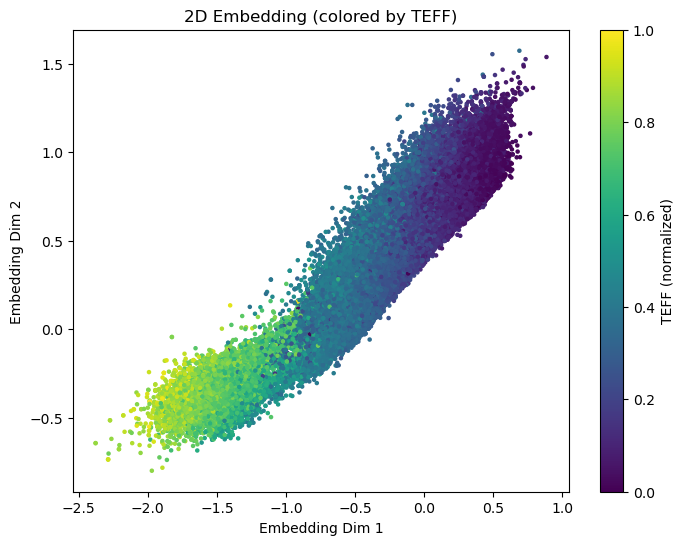

In [13]:
plt.figure(figsize=(8,6), dpi=100)
sc = plt.scatter(Z_all_cpu[:,0], Z_all_cpu[:,1], c=teff_all, s=5, cmap='viridis')
plt.colorbar(sc, label="TEFF (normalized)")
plt.xlabel("Embedding Dim 1")
plt.ylabel("Embedding Dim 2")
plt.title("2D Embedding (colored by TEFF)")
plt.show()

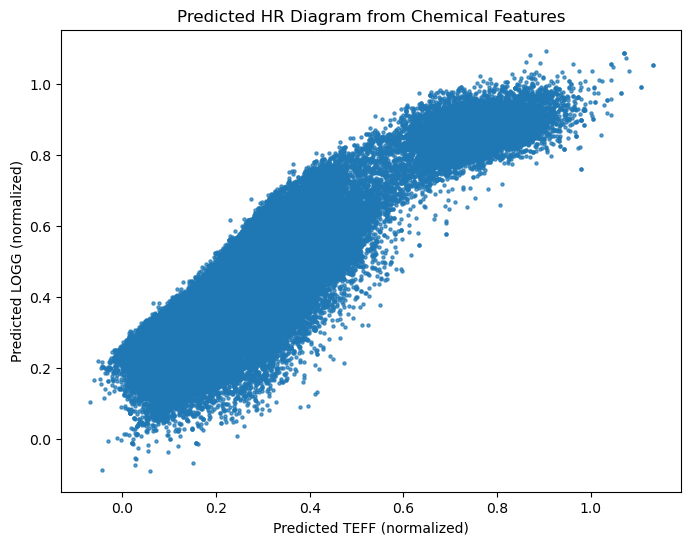

In [12]:
pred_teff = pred_all[:,0]
pred_logg = pred_all[:,1]

plt.figure(figsize=(8,6), dpi=100)
plt.scatter(pred_teff, pred_logg, s=5, alpha=0.7)
plt.xlabel("Predicted TEFF (normalized)")
plt.ylabel("Predicted LOGG (normalized)")
plt.title("Predicted HR Diagram from Chemical Features")
plt.show()

In [15]:
# ###############################################################################
# T-SNE PROJECTION OF THE EMBEDDING (FOR BETTER VISUAL CLARITY)
###############################################################################
import cupy as cp
import cudf
from cuml.manifold import TSNE

# Convert the embedding Z_all_cpu (numpy) to cupy for cuML
Z_all_cupy = cp.asarray(Z_all_cpu)

# Apply t-SNE to get a 2D projection (often helps with local structure)
tsne = TSNE(n_components=2, perplexity=70, n_iter=1000, verbose=True)
Z_tsne_cupy = tsne.fit_transform(Z_all_cupy)  # shape [N, 2]

# Convert to cuDF then to pandas for plotting with matplotlib
Z_tsne_cudf = cudf.DataFrame(Z_tsne_cupy, columns=["tsne1", "tsne2"])
Z_tsne_df = Z_tsne_cudf.to_pandas()



/home/maxime/miniforge3/envs/rapids-25.02/lib/python3.12/site-packages/cuml/internals/api_decorators.py:400: UserWarning: Starting from version 22.04, the default method of TSNE is 'fft'.
  return init_func(self, *args, **filtered_kwargs)


[2025-03-10 10:39:29.866] [CUML] [debug] Learning rate is adaptive. In TSNE paper, it has been shown that as n->inf, Barnes Hut works well if n_neighbors->30, learning_rate->20000, early_exaggeration->24.
[2025-03-10 10:39:29.866] [CUML] [debug] cuML uses an adpative method.n_neighbors decreases to 30 as n->inf. Likewise for the other params.
[2025-03-10 10:39:29.866] [CUML] [debug] New n_neighbors = 30, learning_rate = 58590.0, exaggeration = 24.0
[2025-03-10 10:39:29.866] [CUML] [debug] Data size = (175770, 2) with dim = 2 perplexity = 70.000000
[2025-03-10 10:39:29.866] [CUML] [warning] Perplexity should be within ranges (5, 50). Your results might be a bit strange...
[2025-03-10 10:39:29.866] [CUML] [warning] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
[2025-03-10 10:39:29.866] [CUML] [debug] Getting distances.
[2025-03-10 10:39:32.425] [CUML] [debug] Now normalizing distances so exp(D) doesn't explode.
[2025-03-10 10:39:32.426] 

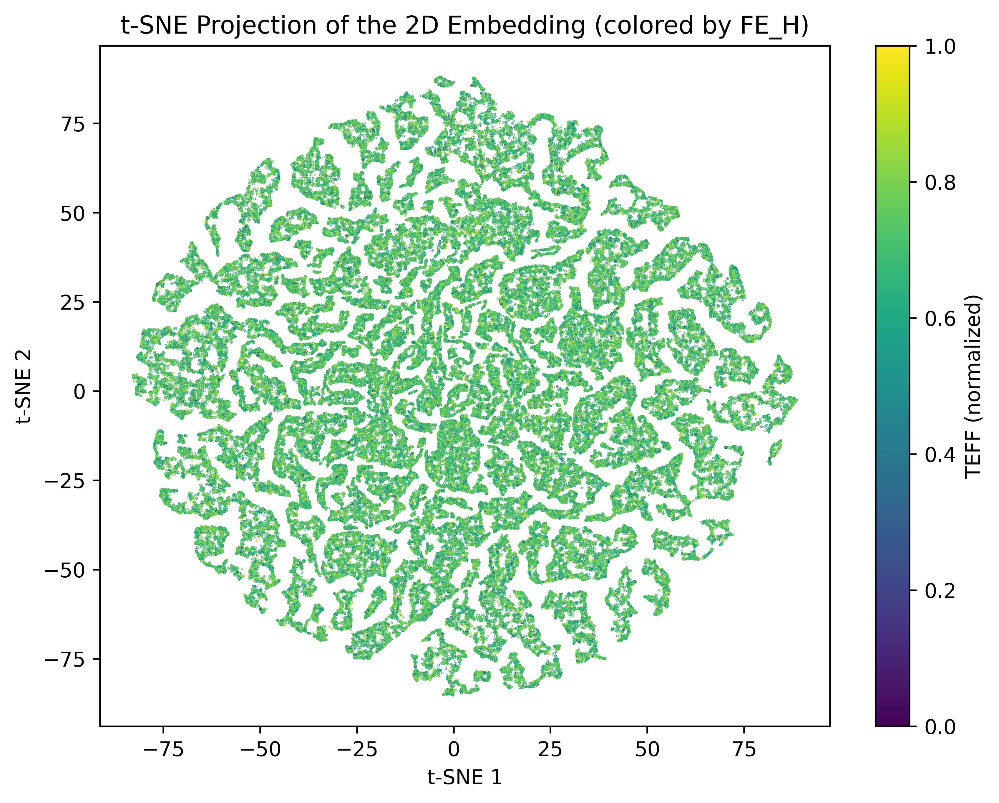

In [20]:

# Plot the t-SNE result
plt.figure(figsize=(8,6), dpi=500)
sc = plt.scatter(
    Z_tsne_df["tsne1"],
    Z_tsne_df["tsne2"],
    c=data['TEFF'],      # color by TEFF if you like
    s=0.05,
    cmap='viridis'
)
plt.colorbar(sc, label="TEFF (normalized)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("t-SNE Projection of the 2D Embedding (colored by TEFF)")
plt.show()

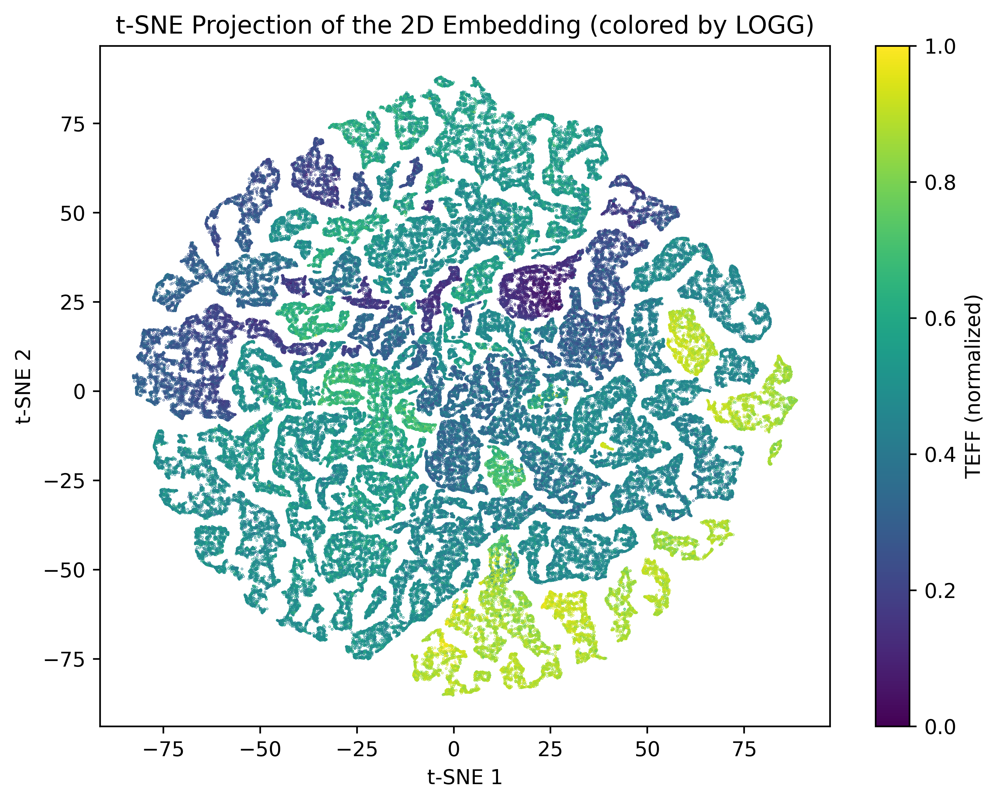

In [19]:

# Plot the t-SNE result
plt.figure(figsize=(8,6), dpi=500)
sc = plt.scatter(
    Z_tsne_df["tsne1"],
    Z_tsne_df["tsne2"],
    c=logg_all,      # color by TEFF if you like
    s=0.05,
    cmap='viridis'
)
plt.colorbar(sc, label="TEFF (normalized)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("t-SNE Projection of the 2D Embedding (colored by LOGG)")
plt.show()